<a href="https://colab.research.google.com/github/codingxperience/sea-turtle-detection-group-six/blob/main/YOLOv8_Sea_Turtle_Challenge.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Necessary imports
import pandas as pd
from PIL import Image, ImageDraw
from PIL import Image
import pandas as pd
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
from matplotlib import animation
import os
import shutil
import cv2
import numpy as np
from skimage import exposure
import matplotlib.pyplot as plt
import glob
from IPython.display import HTML
from matplotlib.animation import FuncAnimation


import random
from itertools import cycle

import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
# def auto_static_crop(image):
#     # Convert image to grayscale
#     gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

#     # Threshold the image to get binary mask
#     _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

#     # Find contours
#     contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

#     # Get bounding box of the largest contour
#     x, y, w, h = cv2.boundingRect(contours[0])

#     # Crop the image
#     cropped_image = image[y:y+h, x:x+w]

#     return cropped_image

In [ ]:
# Function to apply adaptive equalizer contrast
def apply_adaptive_equalizer(image):
    # Convert image to LAB color space
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

    # Split the LAB image into channels
    l, a, b = cv2.split(lab)

    # Apply adaptive histogram equalization to the L channel
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)

    # Merge the channels back together
    equalized_lab = cv2.merge((cl, a, b))

    # Convert LAB image back to RGB color space
    equalized_image = cv2.cvtColor(equalized_lab, cv2.COLOR_LAB2BGR)

    return equalized_image

In [ ]:
# Function to display images
def display_image(image, title):
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Copy and unzip the images
!cp 'drive/My Drive/sea_turtles/IMAGES_512.zip' .
!unzip -q IMAGES_512.zip
image_folder = '/content/IMAGES_512'

In [ ]:
# Load the bounding box annotations
train = pd.read_csv('/content/drive/My Drive/sea_turtles/Train.csv')
print(train.shape)
train.head()

(1326, 5)


,Image_ID,x,y,w,h
0,04FB1B33,0.481988,0.506076,0.174696,0.405671
1,B04E481E,0.617405,0.313368,0.177734,0.293113
2,32655645,0.490885,0.465856,0.165582,0.357350
3,44D4DA7C,0.472873,0.506076,0.237847,0.409722
4,4F36EF72,0.433811,0.574363,0.180773,0.397569


In [ ]:
# Function to generate frames for the animation
def generate_animation_frames():
    for sample_row in train.sample(n=6).values:
        imid, x, y, w, h = sample_row
        with Image.open(f'{image_folder}/{imid}.JPG') as im:
            imw, imh = im.size
            draw = ImageDraw.Draw(im)
            draw.rectangle([int(x*imw), int(y*imh), int((x+w)*imw), int((y+h)*imh)], outline="red", width=2)
            yield np.array(im)

# Create the animation function
def animate(i):
    ax.clear()
    frame = next(frames)
    ax.imshow(frame)
    ax.axis('off')

# Create the animation
fig, ax = plt.subplots(figsize=(8, 6))
frames = cycle(generate_animation_frames())
ani = FuncAnimation(fig, animate, frames=range(6), interval=1000, blit=False)

# Clear the output cell to remove any potential extra images
plt.close()

# Display the animation
display(HTML(ani.to_jshtml()))

In [ ]:
# Load the submission file containing Image IDs
submission_file = '/content/drive/My Drive/sea_turtles/turtle_submission.csv'  # Update this with the actual submission file path
submission_df = pd.read_csv(submission_file)

In [ ]:
# training, val & test images paths
train_image_folder = '/content/drive/My Drive/sea_turtles/data/images/train'
val_image_folder = '/content/drive/My Drive/sea_turtles/data/images/val'
test_image_folder = '/content/drive/My Drive/sea_turtles/data/images/test'  # Update this with the actual test set folder path

In [ ]:
# Get the list of Image IDs used for training from train.csv
train_image_ids = train['Image_ID'].str.replace(' ', '').tolist()

In [ ]:
# Get the list of Image IDs from the submission file
test_image_ids = submission_df['Image_ID'].str.replace(' ', '').tolist()

In [ ]:
# TVT_image_folder if it doesn't exist
if not os.path.exists(train_image_folder):
    os.makedirs(train_image_folder)

if not os.path.exists(val_image_folder):
    os.makedirs(val_image_folder)

if not os.path.exists(test_image_folder):
    os.makedirs(test_image_folder)

In [ ]:
# DEBUG: Train image IDs
print("Number of training image IDs:", len(train_image_ids))

Number of training image IDs: 1326


In [ ]:
# DEBUG: Train contents
print("Contents of train_image_ids:", train_image_ids)

Contents of train_image_ids: ['04FB1B33', 'B04E481E', '32655645', '44D4DA7C', '4F36EF72', 'F966A1AC', '6F9EE77B', '07A099A6', 'B62AD85C', 'C1A5F131', '1C7FCAAD', 'E251184B', 'E0C512FB', '108804B8', 'AD5AA9B5', '7257CF6C', '256CFFDC', '54F47C4A', '659B8876', '120C6CAE', '96445172', '91E34EED', '491F1FE8', 'E67C17B8', '974873B6', 'B574C2C9', '28D3B03E', 'AF6D8D0D', 'A5E4FB76', '2CE7296F', '6BA35AD4', 'F7445BFC', '46C0CD35', '718A826C', '5E168977', 'E44F9AC1', '402CCD11', 'D5C4ECF7', 'AABD3A47', '8D35B0F2', 'B4F808DE', 'ABDEA70F', 'CA892534', '43CD917E', '52825C15', 'BEA5C910', 'C547967E', '24D538AB', 'F606101A', '255D5830', '133557E3', 'C85FC5F9', '327DA8D9', '9601463B', 'C0265EA6', '2BEDB18D', '93A49F0F', '4333651C', '74E6CBD5', 'E978B4AE', 'B19BFE2B', '257C4CB8', 'E9EE27A3', '7AE00F17', 'CECF6010', 'DA40919E', '768EFC27', 'FB35D5EC', 'B8FF7799', 'AD74AA01', '6413A56C', '0A2FE444', '8998208D', 'F1EC5A5E', '37A8ACBE', 'A60AC90B', '164E0597', '9873CA05', '1C70A1ED', 'DE854BF8', '88830576'

In [ ]:
# Split the training set into train and val sets
split_index = int(len(train_image_ids) * 0.8)
train_ids = train_image_ids[:split_index]
val_ids = train_image_ids[split_index:]

In [ ]:
# Print the train and val IDs
print("Train IDs:", train_ids)

Train IDs: ['04FB1B33', 'B04E481E', '32655645', '44D4DA7C', '4F36EF72', 'F966A1AC', '6F9EE77B', '07A099A6', 'B62AD85C', 'C1A5F131', '1C7FCAAD', 'E251184B', 'E0C512FB', '108804B8', 'AD5AA9B5', '7257CF6C', '256CFFDC', '54F47C4A', '659B8876', '120C6CAE', '96445172', '91E34EED', '491F1FE8', 'E67C17B8', '974873B6', 'B574C2C9', '28D3B03E', 'AF6D8D0D', 'A5E4FB76', '2CE7296F', '6BA35AD4', 'F7445BFC', '46C0CD35', '718A826C', '5E168977', 'E44F9AC1', '402CCD11', 'D5C4ECF7', 'AABD3A47', '8D35B0F2', 'B4F808DE', 'ABDEA70F', 'CA892534', '43CD917E', '52825C15', 'BEA5C910', 'C547967E', '24D538AB', 'F606101A', '255D5830', '133557E3', 'C85FC5F9', '327DA8D9', '9601463B', 'C0265EA6', '2BEDB18D', '93A49F0F', '4333651C', '74E6CBD5', 'E978B4AE', 'B19BFE2B', '257C4CB8', 'E9EE27A3', '7AE00F17', 'CECF6010', 'DA40919E', '768EFC27', 'FB35D5EC', 'B8FF7799', 'AD74AA01', '6413A56C', '0A2FE444', '8998208D', 'F1EC5A5E', '37A8ACBE', 'A60AC90B', '164E0597', '9873CA05', '1C70A1ED', 'DE854BF8', '88830576', '90D469BF', 'EFA

In [ ]:
# Move images to train and val directories
for file in os.listdir(image_folder):
    # Extract the file ID
    file_id = file.split('.')[0]

    # Check if the file ID is present in the train_ids list
    if file_id in train_ids:
        shutil.move(os.path.join(image_folder, file), train_image_folder)
        print(f"Moved {file} to train folder")
    elif file_id in val_ids:
        shutil.move(os.path.join(image_folder, file), val_image_folder)
        print(f"Moved {file} to val folder")

Moved 56185DA7.JPG to train folder
Moved 5C9CC94B.JPG to train folder
Moved 8E64D4B7.JPG to train folder
Moved DAB937A2.JPG to train folder
Moved 775AD57E.JPG to train folder
Moved 8688AC20.JPG to train folder
Moved E6CEF7E5.JPG to val folder
Moved 4DA0D7E0.JPG to train folder
Moved 84E956C9.JPG to train folder
Moved B4ABD9A9.JPG to train folder
Moved B391129B.JPG to train folder
Moved 03D45C7C.JPG to train folder
Moved 51711982.JPG to val folder
Moved A5E4FB76.JPG to train folder
Moved 48385E4C.JPG to train folder
Moved 6247D32A.JPG to val folder
Moved A180F8F6.JPG to train folder
Moved C0F21936.JPG to train folder
Moved 03F19EE1.JPG to train folder
Moved BC465449.JPG to train folder
Moved 5806A175.JPG to train folder
Moved 2E9C4AE0.JPG to train folder
Moved 91E8D0BF.JPG to train folder
Moved 76EE6626.JPG to train folder
Moved 08C16611.JPG to train folder
Moved D03D05C6.JPG to train folder
Moved 79B2ABD8.JPG to train folder
Moved C7E6EC92.JPG to val folder
Moved 758E95C9.JPG to train 

In [ ]:
# Move images to test directory based on their Image IDs in the submission file
for file in os.listdir(image_folder):
    # Extract the file ID
    file_id = file.split('.')[0]

    # Check if the file ID is present in the test_image_ids list
    if file_id in test_image_ids:
        shutil.move(os.path.join(image_folder, file), test_image_folder)
        print(f"Moved {file} to test folder")

Moved 3EABDB36.JPG to test folder
Moved 1F33F1F4.JPG to test folder
Moved D02C15C1.JPG to test folder
Moved 9EAD9589.JPG to test folder
Moved 9C384598.JPG to test folder
Moved 74F3AE65.JPG to test folder
Moved 967EE875.JPG to test folder
Moved 53DBD9AD.JPG to test folder
Moved E02ABB6C.JPG to test folder
Moved 0380861A.JPG to test folder
Moved D4D078C2.JPG to test folder
Moved F7245C5F.JPG to test folder
Moved 7F0A3567.JPG to test folder
Moved CF944985.JPG to test folder
Moved 502CF07D.JPG to test folder
Moved E22E3E61.JPG to test folder
Moved FDA39280.JPG to test folder
Moved D932962E.JPG to test folder
Moved 1484E921.JPG to test folder
Moved 9B6ADE47.JPG to test folder
Moved 6226584D.JPG to test folder
Moved 404AFEBF.JPG to test folder
Moved D856172A.JPG to test folder
Moved D3C59C12.JPG to test folder
Moved D9D51468.JPG to test folder
Moved FE00066C.JPG to test folder
Moved B039AC45.JPG to test folder
Moved C8B64404.JPG to test folder
Moved ED970E5B.JPG to test folder
Moved 21CF1373

In [ ]:
# Define the path to save YOLO format annotations
annotation_folder = '/content/drive/My Drive/sea_turtles/data/labels'
train_annotation_folder = os.path.join(annotation_folder, 'train')
val_annotation_folder = os.path.join(annotation_folder, 'val')

In [ ]:
# Create the annotations directories if they don't exist
os.makedirs(train_annotation_folder, exist_ok=True)
os.makedirs(val_annotation_folder, exist_ok=True)

In [ ]:
# Function to format bounding box coordinates to desired precision
def format_coordinates(coord):
    # Split the coordinate into integer and fractional parts
    integer_part, fractional_part = str(coord).split('.')
    # Format the fractional part to 10 decimal places
    formatted_fractional_part = '{:.10f}'.format(float('0.' + fractional_part))
    # Combine integer part and formatted fractional part
    formatted_coord = f"{integer_part}.{formatted_fractional_part[2:]}"
    return formatted_coord

In [ ]:
# Iterate over each image in the Train.csv file for training images
for idx, row in train[train['Image_ID'].isin(train_ids)].iterrows():
    img_id, x, y, w, h = row

    # Format coordinates to desired precision
    x, y, w, h = map(format_coordinates, (x, y, w, h))

    # Determine the image file path
    image_file_path = os.path.join(train_image_folder, f"{img_id}.JPG")

    # Check if the image file exists
    if os.path.exists(image_file_path):
        # Convert class_id to YOLO format (assuming it's always 0)
        class_id = 0

        # Write the YOLO annotation to a text file
        annotation_file = os.path.join(train_annotation_folder, f"{img_id}.txt")
        with open(annotation_file, 'w') as f:
            f.write(f"{class_id} {x} {y} {w} {h}")
    else:
        print(f"Image file not found: {image_file_path}")

In [ ]:
# Iterate over each image in the Train.csv file for validation images
for idx, row in train[train['Image_ID'].isin(val_ids)].iterrows():
    img_id, x, y, w, h = row

    # Format coordinates to desired precision
    x, y, w, h = map(format_coordinates, (x, y, w, h))

    # Determine the image file path
    image_file_path = os.path.join(val_image_folder, f"{img_id}.JPG")

    # Check if the image file exists
    if os.path.exists(image_file_path):
        # Convert class_id to YOLO format (assuming it's always 0)
        class_id = 0

        # Write the YOLO annotation to a text file
        annotation_file = os.path.join(val_annotation_folder, f"{img_id}.txt")
        with open(annotation_file, 'w') as f:
            f.write(f"{class_id} {x} {y} {w} {h}")
    else:
        print(f"Image file not found: {image_file_path}")

In [ ]:
# Select a subset of images for preprocessing from both train and val sets
selected_train_image_ids = random.sample(train_ids, k=50)
selected_val_image_ids = random.sample(val_ids, k=10)

# Select a subset of images for preprocessing from the test set
selected_test_image_ids = random.sample(test_image_ids, k=10)

In [ ]:
# # Preprocess images in the train and validation sets
# for img_id in train_ids + val_ids:
#     if img_id in train_ids:
#         image_file_path = os.path.join(train_image_folder, f"{img_id}.JPG")
#     elif img_id in val_ids:
#         image_file_path = os.path.join(val_image_folder, f"{img_id}.JPG")

#     if os.path.exists(image_file_path):
#         image = cv2.imread(image_file_path)

#         # Apply auto-static crop to all images
#         cropped_image = auto_static_crop(image)

#         # Write the cropped image back to the appropriate folder, overriding the original
#         cv2.imwrite(image_file_path, cropped_image)

In [ ]:
# Preprocess selected images in the train set
preprocessed_train_ids = []
for img_id in selected_train_image_ids:
    image_file_path = os.path.join(train_image_folder, f"{img_id}.JPG")
    if os.path.exists(image_file_path):
        image = cv2.imread(image_file_path)

        # Apply adaptive equalizer contrast to selected images
        preprocessed_image = apply_adaptive_equalizer(image)

        # Write the preprocessed image back to the train_image_folder, overriding the original
        cv2.imwrite(image_file_path, preprocessed_image)

        preprocessed_train_ids.append(img_id)

In [ ]:
# Preprocess selected images in the val set
preprocessed_val_ids = []
for img_id in selected_val_image_ids:
    image_file_path = os.path.join(val_image_folder, f"{img_id}.JPG")
    if os.path.exists(image_file_path):
        image = cv2.imread(image_file_path)

        # Apply adaptive equalizer contrast to selected images
        preprocessed_image = apply_adaptive_equalizer(image)

        # Write the preprocessed image back to the val_image_folder, overriding the original
        cv2.imwrite(image_file_path, preprocessed_image)

        preprocessed_val_ids.append(img_id)

In [ ]:
# Preprocess selected images in the test set
preprocessed_test_ids = []
for img_id in selected_test_image_ids:
    image_file_path = os.path.join(test_image_folder, f"{img_id}.JPG")
    if os.path.exists(image_file_path):
        image = cv2.imread(image_file_path)

        # Apply preprocessing to selected images
        preprocessed_image = apply_adaptive_equalizer(image)

        # Write the preprocessed image back to the test_image_folder, overriding the original
        cv2.imwrite(image_file_path, preprocessed_image)

        preprocessed_test_ids.append(img_id)

In [ ]:
# # Display one original, one cropped, and one preprocessed image from the training set
# selected_train_image_id = random.choice(train_ids)
# selected_train_image_file_path = os.path.join(train_image_folder, f"{selected_train_image_id}.JPG")
# selected_train_cropped_image_file_path = os.path.join(train_image_folder, f"{selected_train_image_id}.JPG")

In [ ]:
# if os.path.exists(selected_train_image_file_path):
#     selected_train_image = cv2.imread(selected_train_image_file_path)
#     selected_train_cropped_image = cv2.imread(selected_train_cropped_image_file_path)

#     display_image(selected_train_image, f"Original Image (Train) - ID: {selected_train_image_id}")
#     display_image(selected_train_cropped_image, f"Cropped Image (Train) - ID: {selected_train_image_id}")

In [ ]:
# # Display one original, one cropped, and one preprocessed image from the validation set
# selected_val_image_id = random.choice(val_ids)
# selected_val_image_file_path = os.path.join(val_image_folder, f"{selected_val_image_id}.JPG")
# selected_val_cropped_image_file_path = os.path.join(val_image_folder, f"{selected_val_image_id}.JPG")

In [ ]:
# if os.path.exists(selected_val_image_file_path):
#     selected_val_image = cv2.imread(selected_val_image_file_path)
#     selected_val_cropped_image = cv2.imread(selected_val_cropped_image_file_path)

#     display_image(selected_val_image, f"Original Image (Validation) - ID: {selected_val_image_id}")
#     display_image(selected_val_cropped_image, f"Cropped Image (Validation) - ID: {selected_val_image_id}")

In [ ]:
# # Display one preprocessed image from the training set
# selected_preprocessed_train_id = random.choice(preprocessed_train_ids)
# selected_preprocessed_train_file_path = os.path.join(train_image_folder, f"{selected_preprocessed_train_id}.JPG")

# if os.path.exists(selected_preprocessed_train_file_path):
#     selected_preprocessed_train_image = cv2.imread(selected_preprocessed_train_file_path)
#     display_image(selected_preprocessed_train_image, f"Preprocessed Image (Train) - ID: {selected_preprocessed_train_id}")

In [ ]:
# # Display one preprocessed image from the validation set
# selected_preprocessed_val_id = random.choice(preprocessed_val_ids)
# selected_preprocessed_val_file_path = os.path.join(val_image_folder, f"{selected_preprocessed_val_id}.JPG")

# if os.path.exists(selected_preprocessed_val_file_path):
#     selected_preprocessed_val_image = cv2.imread(selected_preprocessed_val_file_path)
#     display_image(selected_preprocessed_val_image, f"Preprocessed Image (Validation) - ID: {selected_preprocessed_val_id}")

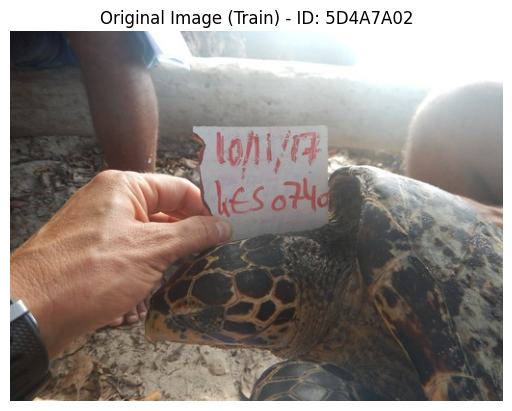

In [ ]:
# Display one original image from the training set
selected_train_image_id = random.choice(train_ids)
selected_train_image_file_path = os.path.join(train_image_folder, f"{selected_train_image_id}.JPG")

if os.path.exists(selected_train_image_file_path):
    selected_train_image = cv2.imread(selected_train_image_file_path)
    display_image(selected_train_image, f"Original Image (Train) - ID: {selected_train_image_id}")

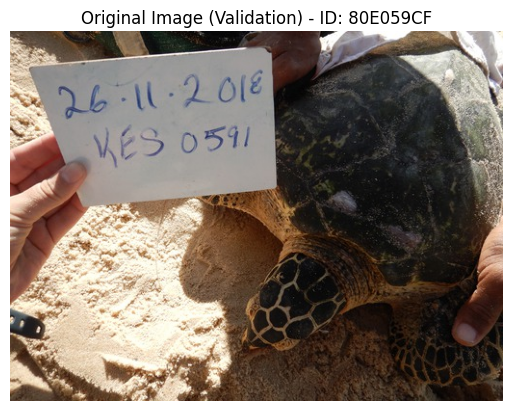

In [ ]:
# Display one original image from the validation set
selected_val_image_id = random.choice(val_ids)
selected_val_image_file_path = os.path.join(val_image_folder, f"{selected_val_image_id}.JPG")

if os.path.exists(selected_val_image_file_path):
    selected_val_image = cv2.imread(selected_val_image_file_path)
    display_image(selected_val_image, f"Original Image (Validation) - ID: {selected_val_image_id}")

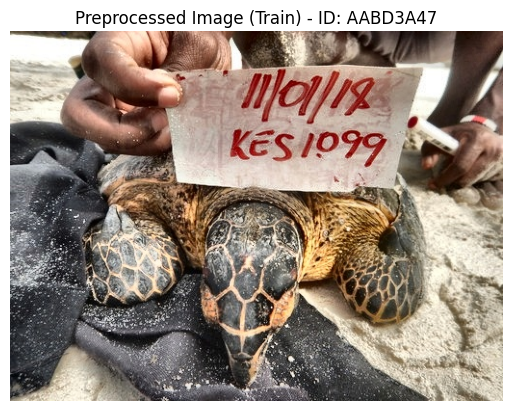

In [ ]:
# Display one preprocessed image from the training set
selected_preprocessed_train_id = random.choice(preprocessed_train_ids)
selected_preprocessed_train_file_path = os.path.join(train_image_folder, f"{selected_preprocessed_train_id}.JPG")

if os.path.exists(selected_preprocessed_train_file_path):
    selected_preprocessed_train_image = cv2.imread(selected_preprocessed_train_file_path)
    display_image(selected_preprocessed_train_image, f"Preprocessed Image (Train) - ID: {selected_preprocessed_train_id}")


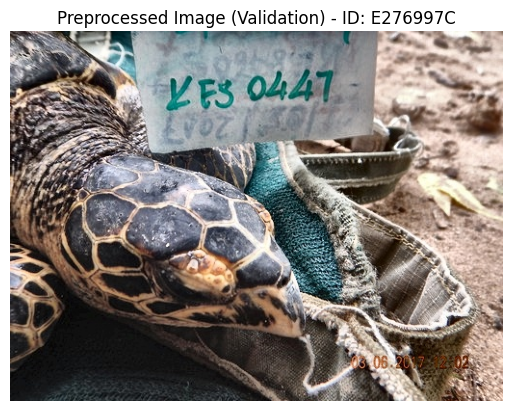

In [ ]:
# Display one preprocessed image from the validation set
selected_preprocessed_val_id = random.choice(preprocessed_val_ids)
selected_preprocessed_val_file_path = os.path.join(val_image_folder, f"{selected_preprocessed_val_id}.JPG")

if os.path.exists(selected_preprocessed_val_file_path):
    selected_preprocessed_val_image = cv2.imread(selected_preprocessed_val_file_path)
    display_image(selected_preprocessed_val_image, f"Preprocessed Image (Validation) - ID: {selected_preprocessed_val_id}")

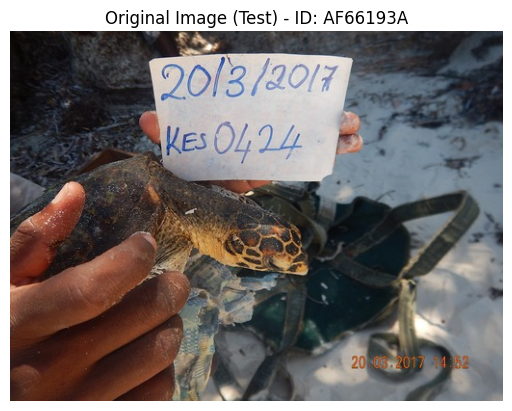

In [ ]:
# Display one original image from the test set
selected_test_image_id = random.choice(test_image_ids)
selected_test_image_file_path = os.path.join(test_image_folder, f"{selected_test_image_id}.JPG")

if os.path.exists(selected_test_image_file_path):
    selected_test_image = cv2.imread(selected_test_image_file_path)
    display_image(selected_test_image, f"Original Image (Test) - ID: {selected_test_image_id}")

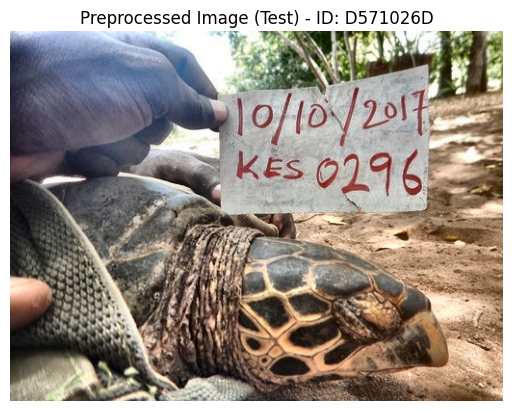

In [ ]:
# Display one preprocessed image from the test set
selected_preprocessed_test_id = random.choice(preprocessed_test_ids)
selected_preprocessed_test_file_path = os.path.join(test_image_folder, f"{selected_preprocessed_test_id}.JPG")

if os.path.exists(selected_preprocessed_test_file_path):
    selected_preprocessed_test_image = cv2.imread(selected_preprocessed_test_file_path)
    display_image(selected_preprocessed_test_image, f"Preprocessed Image (Test) - ID: {selected_preprocessed_test_id}")

In [ ]:
# Path to the sea_turtles folder containing Train.csv and Val.csv
ROOT_DIR = '/content/drive/My Drive/sea_turtles/'

In [ ]:
# Create data.yaml file inside the data folder
data_yaml = f"""
path: "/content/drive/My Drive/sea_turtles/data"
train: {train_image_folder}
val: {val_image_folder}
test: {test_image_folder}

names:
  0: turtle
"""

with open('/content/drive/My Drive/sea_turtles/data.yaml', 'w') as f:
    f.write(data_yaml)

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 752.1/752.1 kB 12.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-man

In [ ]:
import os

from ultralytics import YOLO


# Load a model
model = YOLO("yolov8n.pt")  # build a new model from scratch

# Use the model
results = model.train(data=os.path.join(ROOT_DIR, "data.yaml"), epochs=150)  # train the model

100%|██████████| 6.23M/6.23M [00:00<00:00, 134MB/s]


Ultralytics YOLOv8.2.4 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/My Drive/sea_turtles/data.yaml, epochs=150, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sh

100%|██████████| 755k/755k [00:00<00:00, 23.1MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/drive/My Drive/sea_turtles/data/labels/train... 1060 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1060/1060 [00:15<00:00, 67.89it/s] 


train: New cache created: /content/drive/My Drive/sea_turtles/data/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/My Drive/sea_turtles/data/labels/val... 266 images, 0 backgrounds, 0 corrupt: 100%|██████████| 266/266 [00:03<00:00, 66.90it/s] 


val: New cache created: /content/drive/My Drive/sea_turtles/data/labels/val.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150      2.47G      2.456      3.667      2.602         15        640: 100%|██████████| 67/67 [00:31<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.48it/s]

                   all        266        266      0.327     0.0677     0.0964     0.0317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150      2.28G      1.958      2.638      2.185          7        640: 100%|██████████| 67/67 [00:28<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.82it/s]


                   all        266        266      0.383      0.643      0.361      0.163

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150      2.29G      1.839      2.306       2.04          5        640: 100%|██████████| 67/67 [00:26<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.45it/s]


                   all        266        266       0.57      0.568       0.56      0.245

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150       2.3G      1.744      2.048      1.972          6        640: 100%|██████████| 67/67 [00:26<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.73it/s]


                   all        266        266      0.239      0.654      0.219     0.0797

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150      2.29G      1.667      1.869      1.889         11        640: 100%|██████████| 67/67 [00:27<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.83it/s]

                   all        266        266      0.596      0.832      0.672       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150      2.29G      1.618      1.758       1.87          6        640: 100%|██████████| 67/67 [00:27<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.83it/s]

                   all        266        266      0.482      0.782      0.605      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150       2.3G      1.547      1.671      1.766         10        640: 100%|██████████| 67/67 [00:27<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.19it/s]


                   all        266        266       0.43      0.872      0.434      0.276

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150      2.29G      1.484      1.528      1.713          7        640: 100%|██████████| 67/67 [00:26<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.25it/s]

                   all        266        266      0.651      0.838      0.757      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150      2.29G      1.477      1.516      1.721         10        640: 100%|██████████| 67/67 [00:27<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.72it/s]

                   all        266        266      0.674      0.891      0.795      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150      2.29G      1.413      1.426      1.673         13        640: 100%|██████████| 67/67 [00:27<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.99it/s]

                   all        266        266      0.569      0.782      0.702      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150       2.3G      1.365      1.392      1.623          6        640: 100%|██████████| 67/67 [00:26<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.75it/s]

                   all        266        266      0.612      0.865      0.782      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150       2.3G      1.401      1.361      1.646          7        640: 100%|██████████| 67/67 [00:26<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.71it/s]

                   all        266        266      0.737      0.842      0.841      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150      2.29G      1.353      1.311      1.588         11        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.73it/s]

                   all        266        266      0.601      0.928      0.797      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150      2.29G      1.292      1.203      1.545          9        640: 100%|██████████| 67/67 [00:26<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.02it/s]

                   all        266        266      0.525      0.838       0.63      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150       2.3G      1.269      1.245       1.53          7        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.86it/s]

                   all        266        266       0.78      0.878      0.906      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150      2.29G      1.281      1.202      1.555         10        640: 100%|██████████| 67/67 [00:27<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.78it/s]

                   all        266        266      0.846      0.908      0.952       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150      2.29G      1.271      1.196      1.537          6        640: 100%|██████████| 67/67 [00:26<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.65it/s]

                   all        266        266       0.76      0.827      0.837      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150      2.29G      1.247      1.159      1.509          9        640: 100%|██████████| 67/67 [00:27<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.48it/s]

                   all        266        266      0.897      0.906      0.968      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150       2.3G      1.204      1.146      1.485          9        640: 100%|██████████| 67/67 [00:25<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.00it/s]

                   all        266        266      0.859      0.917      0.934       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150      2.29G      1.215      1.104      1.482         11        640: 100%|██████████| 67/67 [00:26<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.86it/s]

                   all        266        266      0.835      0.977      0.958      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150      2.29G      1.192      1.114      1.469          7        640: 100%|██████████| 67/67 [00:26<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.80it/s]

                   all        266        266      0.678      0.853      0.831      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150      2.29G      1.193      1.086      1.453         10        640: 100%|██████████| 67/67 [00:26<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.32it/s]

                   all        266        266      0.755      0.787      0.825      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150       2.3G      1.154      1.065      1.441          7        640: 100%|██████████| 67/67 [00:25<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.86it/s]

                   all        266        266      0.795      0.861      0.872      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150      2.29G      1.145      1.042      1.423         11        640: 100%|██████████| 67/67 [00:26<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.65it/s]

                   all        266        266      0.836      0.941      0.947       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150      2.29G      1.148      1.016      1.426          5        640: 100%|██████████| 67/67 [00:26<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.78it/s]

                   all        266        266      0.884      0.955      0.972      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150      2.29G      1.118     0.9903      1.415          7        640: 100%|██████████| 67/67 [00:26<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.56it/s]

                   all        266        266      0.932      0.871      0.968      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150       2.3G      1.125     0.9949      1.391         10        640: 100%|██████████| 67/67 [00:25<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.79it/s]


                   all        266        266      0.907      0.948      0.974      0.709

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150      2.29G      1.119      1.003      1.411          8        640: 100%|██████████| 67/67 [00:26<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.85it/s]

                   all        266        266      0.869      0.921      0.969      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150      2.29G      1.098     0.9659      1.394         12        640: 100%|██████████| 67/67 [00:26<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.91it/s]

                   all        266        266      0.886      0.966      0.964      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150      2.29G      1.082      0.974      1.387          5        640: 100%|██████████| 67/67 [00:27<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.26it/s]

                   all        266        266      0.908      0.985      0.988        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150       2.3G      1.065     0.9439      1.371          6        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.45it/s]

                   all        266        266      0.857      0.899      0.924      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150      2.29G      1.115     0.9628      1.395         10        640: 100%|██████████| 67/67 [00:26<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.81it/s]

                   all        266        266      0.958       0.95      0.989      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150      2.29G      1.103     0.9929      1.398          7        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.95it/s]

                   all        266        266      0.646      0.827      0.755      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150      2.29G      1.084     0.9642       1.38          7        640: 100%|██████████| 67/67 [00:26<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.93it/s]

                   all        266        266      0.934      0.936      0.983      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150       2.3G      1.059     0.9243      1.355         11        640: 100%|██████████| 67/67 [00:26<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.61it/s]


                   all        266        266      0.918      0.932      0.969      0.676

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150      2.29G        1.1     0.9722      1.388          7        640: 100%|██████████| 67/67 [00:26<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.89it/s]

                   all        266        266      0.856      0.962      0.936      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150      2.29G       1.05     0.9454      1.348         10        640: 100%|██████████| 67/67 [00:26<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.79it/s]

                   all        266        266       0.95      0.951      0.985      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150      2.29G      1.017     0.9055      1.327         10        640: 100%|██████████| 67/67 [00:26<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.89it/s]

                   all        266        266      0.961      0.931      0.985      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150       2.3G       1.05     0.9133      1.364         10        640: 100%|██████████| 67/67 [00:26<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.83it/s]


                   all        266        266      0.922      0.955      0.974      0.699

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150      2.29G      1.061     0.9163      1.367          5        640: 100%|██████████| 67/67 [00:26<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.04it/s]

                   all        266        266      0.954      0.981      0.992      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150      2.29G      1.016     0.8942      1.333          6        640: 100%|██████████| 67/67 [00:26<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.87it/s]

                   all        266        266      0.966       0.96      0.988      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150      2.29G      1.017     0.9156      1.329          6        640: 100%|██████████| 67/67 [00:25<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.92it/s]

                   all        266        266      0.935      0.966      0.988      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150       2.3G     0.9935     0.8428      1.313         10        640: 100%|██████████| 67/67 [00:26<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.65it/s]

                   all        266        266      0.959      0.959      0.989      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150      2.29G      1.026     0.8759      1.343         10        640: 100%|██████████| 67/67 [00:25<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.76it/s]

                   all        266        266      0.899      0.921      0.974      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150      2.29G     0.9811     0.8476      1.293         11        640: 100%|██████████| 67/67 [00:26<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.74it/s]

                   all        266        266      0.904      0.977      0.956      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150      2.29G     0.9642     0.8477      1.279          6        640: 100%|██████████| 67/67 [00:25<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.68it/s]

                   all        266        266      0.962      0.959      0.988      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150       2.3G      1.003     0.8474      1.311         12        640: 100%|██████████| 67/67 [00:24<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.84it/s]

                   all        266        266      0.944      0.954      0.977      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150      2.29G      1.001     0.8448      1.311         10        640: 100%|██████████| 67/67 [00:26<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.94it/s]

                   all        266        266       0.96      0.988      0.991      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150      2.29G     0.9556     0.8324       1.28          7        640: 100%|██████████| 67/67 [00:26<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.92it/s]

                   all        266        266      0.917      0.989       0.99       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150      2.29G     0.9216     0.7868      1.255          9        640: 100%|██████████| 67/67 [00:26<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.12it/s]

                   all        266        266      0.901      0.958      0.973      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150       2.3G      0.978       0.87      1.311          6        640: 100%|██████████| 67/67 [00:26<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.97it/s]

                   all        266        266      0.904      0.961      0.964      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150       2.3G     0.9734     0.8267      1.291          7        640: 100%|██████████| 67/67 [00:25<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.04it/s]

                   all        266        266      0.922      0.959      0.983      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150      2.29G     0.9503     0.7826      1.262          6        640: 100%|██████████| 67/67 [00:26<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.88it/s]

                   all        266        266      0.961      0.951      0.989      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150      2.29G     0.9321     0.8109      1.271         11        640: 100%|██████████| 67/67 [00:26<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.68it/s]


                   all        266        266      0.978      0.991      0.994      0.721

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150       2.3G     0.9655     0.8463      1.286         10        640: 100%|██████████| 67/67 [00:26<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.06it/s]

                   all        266        266       0.96      0.989      0.992      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150      2.29G     0.9637     0.8352      1.287          6        640: 100%|██████████| 67/67 [00:25<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.98it/s]

                   all        266        266      0.947       0.94      0.988      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150      2.29G     0.9311     0.8026      1.258          9        640: 100%|██████████| 67/67 [00:25<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.57it/s]

                   all        266        266      0.959      0.966       0.99       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/150      2.29G     0.9132     0.7956      1.248         10        640: 100%|██████████| 67/67 [00:25<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.10it/s]

                   all        266        266      0.935      0.985      0.988       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150       2.3G      0.915     0.7876      1.242         10        640: 100%|██████████| 67/67 [00:26<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.99it/s]

                   all        266        266      0.942       0.98      0.988       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150      2.29G     0.9035     0.7928      1.247          7        640: 100%|██████████| 67/67 [00:26<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.47it/s]

                   all        266        266      0.961      0.934      0.985      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150      2.29G     0.9256     0.7854      1.256          5        640: 100%|██████████| 67/67 [00:25<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.96it/s]

                   all        266        266      0.968      0.989      0.993      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150      2.29G     0.9322     0.7983      1.272          3        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.98it/s]

                   all        266        266      0.908      0.963      0.979      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150       2.3G     0.9217     0.7727      1.251          8        640: 100%|██████████| 67/67 [00:26<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.75it/s]

                   all        266        266      0.949      0.996      0.991      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150      2.29G     0.8857     0.7514       1.23          9        640: 100%|██████████| 67/67 [00:26<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.05it/s]

                   all        266        266      0.789      0.883      0.897      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150      2.29G     0.9161     0.7979      1.259          9        640: 100%|██████████| 67/67 [00:25<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.98it/s]


                   all        266        266      0.937      0.966      0.984      0.757

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150      2.29G     0.9141     0.7681      1.256          9        640: 100%|██████████| 67/67 [00:26<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.74it/s]

                   all        266        266      0.985       0.97      0.993      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/150       2.3G     0.9125     0.8075      1.257          5        640: 100%|██████████| 67/67 [00:26<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.78it/s]

                   all        266        266      0.952      0.981       0.99      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/150      2.29G     0.8961     0.7473       1.22          8        640: 100%|██████████| 67/67 [00:26<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.97it/s]

                   all        266        266      0.962      0.947      0.988      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/150      2.29G     0.8783     0.7268      1.224          6        640: 100%|██████████| 67/67 [00:26<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.88it/s]

                   all        266        266      0.963      0.989      0.994      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/150      2.29G     0.8637     0.7451      1.213          5        640: 100%|██████████| 67/67 [00:26<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.87it/s]


                   all        266        266      0.989       0.98      0.994      0.758

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/150       2.3G     0.8534     0.7131      1.203          7        640: 100%|██████████| 67/67 [00:26<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.91it/s]

                   all        266        266      0.945      0.962      0.972      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/150      2.29G     0.8875     0.7392      1.226         10        640: 100%|██████████| 67/67 [00:26<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.80it/s]


                   all        266        266      0.893      0.902      0.957      0.679

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/150      2.29G     0.8974     0.7432      1.218          8        640: 100%|██████████| 67/67 [00:26<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.94it/s]

                   all        266        266      0.945      0.964      0.985      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/150      2.29G     0.8576     0.7533       1.21          5        640: 100%|██████████| 67/67 [00:25<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.52it/s]

                   all        266        266      0.902       0.91       0.97      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/150       2.3G     0.8565     0.7306      1.212          6        640: 100%|██████████| 67/67 [00:25<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.91it/s]

                   all        266        266      0.932       0.98      0.984      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/150      2.29G     0.8485      0.727      1.201         10        640: 100%|██████████| 67/67 [00:25<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.80it/s]


                   all        266        266      0.985      0.972      0.992      0.755

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/150      2.29G     0.8475      0.721      1.196         10        640: 100%|██████████| 67/67 [00:25<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.93it/s]

                   all        266        266      0.949      0.959      0.988      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/150      2.29G     0.8436     0.7187      1.193          9        640: 100%|██████████| 67/67 [00:25<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.16it/s]

                   all        266        266      0.952      0.962      0.987      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/150       2.3G     0.8324     0.6945       1.19         11        640: 100%|██████████| 67/67 [00:25<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.12it/s]

                   all        266        266      0.926      0.944      0.975      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/150      2.29G     0.8311      0.722      1.199          9        640: 100%|██████████| 67/67 [00:26<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.06it/s]

                   all        266        266      0.961      0.981      0.989      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/150      2.29G     0.8654     0.7108      1.213         10        640: 100%|██████████| 67/67 [00:25<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  3.00it/s]

                   all        266        266       0.96      0.991      0.991      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/150      2.29G      0.827     0.6805      1.174         12        640: 100%|██████████| 67/67 [00:26<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.04it/s]

                   all        266        266      0.973      0.977      0.991      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/150       2.3G     0.8393     0.6953        1.2          8        640: 100%|██████████| 67/67 [00:25<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.17it/s]

                   all        266        266      0.973      0.974      0.989      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/150      2.29G     0.8019     0.6821      1.168         13        640: 100%|██████████| 67/67 [00:24<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.14it/s]

                   all        266        266      0.951      0.966      0.987      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/150      2.29G     0.8335     0.7159      1.204          8        640: 100%|██████████| 67/67 [00:26<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.94it/s]

                   all        266        266      0.975      0.981      0.992      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/150      2.29G      0.827     0.6945      1.184          7        640: 100%|██████████| 67/67 [00:26<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.02it/s]

                   all        266        266      0.962      0.989      0.991      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/150       2.3G     0.8036     0.6788      1.175          6        640: 100%|██████████| 67/67 [00:26<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.88it/s]

                   all        266        266       0.97      0.972      0.992      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/150      2.29G     0.8251     0.6917      1.189         10        640: 100%|██████████| 67/67 [00:25<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.98it/s]

                   all        266        266      0.956      0.989      0.991      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/150      2.29G      0.814     0.6851      1.178          8        640: 100%|██████████| 67/67 [00:26<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.71it/s]

                   all        266        266       0.96      0.988       0.99       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/150      2.29G     0.8265     0.7055      1.192          5        640: 100%|██████████| 67/67 [00:26<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.00it/s]

                   all        266        266       0.96      0.981      0.992      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/150       2.3G     0.8071     0.6832      1.179          6        640: 100%|██████████| 67/67 [00:26<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.02it/s]

                   all        266        266      0.981      0.955      0.992      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/150      2.29G     0.8171     0.6896      1.166         10        640: 100%|██████████| 67/67 [00:26<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.47it/s]

                   all        266        266      0.952      0.989      0.992      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/150      2.29G     0.7744      0.668      1.154          6        640: 100%|██████████| 67/67 [00:25<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.03it/s]

                   all        266        266      0.971      0.991      0.994       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/150      2.29G     0.8007     0.6828       1.17          6        640: 100%|██████████| 67/67 [00:26<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.65it/s]

                   all        266        266      0.933      0.992      0.991      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/150       2.3G     0.7788     0.6587      1.151          8        640: 100%|██████████| 67/67 [00:26<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.76it/s]

                   all        266        266      0.992      0.966      0.993      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/150      2.29G     0.8041     0.6698      1.165          6        640: 100%|██████████| 67/67 [00:26<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.23it/s]

                   all        266        266      0.962      0.959       0.99      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/150      2.29G     0.7896     0.6556      1.158          7        640: 100%|██████████| 67/67 [00:25<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.24it/s]

                   all        266        266      0.956      0.959       0.99      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/150      2.29G     0.7755      0.653      1.155         10        640: 100%|██████████| 67/67 [00:26<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.85it/s]

                   all        266        266      0.963      0.967       0.99      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/150       2.3G     0.7761     0.6513      1.154         11        640: 100%|██████████| 67/67 [00:25<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.73it/s]

                   all        266        266      0.974      0.989      0.993      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/150      2.29G     0.7663     0.6444      1.154          9        640: 100%|██████████| 67/67 [00:26<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.62it/s]

                   all        266        266      0.935      0.977      0.989      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/150      2.29G     0.7461     0.6374      1.131          8        640: 100%|██████████| 67/67 [00:25<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.00it/s]

                   all        266        266       0.97      0.979      0.994       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/150      2.29G     0.7769     0.6608      1.159         13        640: 100%|██████████| 67/67 [00:26<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.85it/s]


                   all        266        266      0.977      0.974      0.993      0.774

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/150       2.3G     0.7384     0.6421      1.137          8        640: 100%|██████████| 67/67 [00:26<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.12it/s]

                   all        266        266      0.978      0.981      0.994      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/150      2.29G     0.7664      0.632      1.156          7        640: 100%|██████████| 67/67 [00:26<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.93it/s]

                   all        266        266      0.975       0.97      0.993      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/150      2.29G     0.7472     0.6247      1.135         11        640: 100%|██████████| 67/67 [00:25<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.94it/s]

                   all        266        266      0.974       0.97      0.992      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/150      2.29G      0.768     0.6559      1.148          5        640: 100%|██████████| 67/67 [00:26<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.94it/s]

                   all        266        266      0.985       0.97      0.993      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/150       2.3G     0.7435     0.6346      1.128          9        640: 100%|██████████| 67/67 [00:26<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.66it/s]

                   all        266        266       0.96      0.962      0.986      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/150      2.29G     0.7423     0.6352      1.136         11        640: 100%|██████████| 67/67 [00:26<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.83it/s]

                   all        266        266      0.945      0.985      0.991      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/150      2.29G     0.7455     0.6374      1.129          6        640: 100%|██████████| 67/67 [00:26<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.38it/s]


                   all        266        266      0.933      0.981      0.989      0.745

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/150      2.29G     0.7462      0.625      1.131          9        640: 100%|██████████| 67/67 [00:25<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.18it/s]

                   all        266        266      0.974      0.985      0.994      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/150       2.3G     0.7172     0.5982       1.11          5        640: 100%|██████████| 67/67 [00:26<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.02it/s]

                   all        266        266       0.96      0.974       0.99      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/150      2.29G     0.7304     0.6096      1.123          8        640: 100%|██████████| 67/67 [00:27<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.94it/s]

                   all        266        266      0.956      0.973      0.991      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/150      2.29G     0.7065     0.6081        1.1          8        640: 100%|██████████| 67/67 [00:26<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.36it/s]

                   all        266        266      0.972      0.985      0.993      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/150      2.29G     0.7211     0.6168      1.123          9        640: 100%|██████████| 67/67 [00:25<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.07it/s]

                   all        266        266      0.977      0.992      0.994       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/150       2.3G     0.7084      0.617      1.111         10        640: 100%|██████████| 67/67 [00:26<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.76it/s]

                   all        266        266      0.976      0.989      0.994      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/150      2.29G     0.7225     0.6199      1.125         11        640: 100%|██████████| 67/67 [00:26<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.03it/s]

                   all        266        266      0.957      0.985      0.993      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/150      2.29G     0.7181     0.6097      1.128          8        640: 100%|██████████| 67/67 [00:26<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.84it/s]

                   all        266        266      0.974      0.987      0.994      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/150      2.29G     0.7089     0.6049      1.113          5        640: 100%|██████████| 67/67 [00:26<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.96it/s]

                   all        266        266       0.96      0.992      0.993      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/150       2.3G     0.7281     0.6197      1.122         10        640: 100%|██████████| 67/67 [00:26<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.64it/s]

                   all        266        266      0.969      0.992      0.993      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/150      2.29G     0.7177     0.6374       1.12          7        640: 100%|██████████| 67/67 [00:26<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.92it/s]

                   all        266        266      0.977      0.989      0.994      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/150      2.29G      0.697     0.6033      1.107          7        640: 100%|██████████| 67/67 [00:26<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.02it/s]

                   all        266        266      0.972      0.981      0.993      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/150      2.29G     0.7087     0.5891      1.101         14        640: 100%|██████████| 67/67 [00:26<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.38it/s]

                   all        266        266      0.967      0.995      0.994      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/150       2.3G     0.6917     0.5939      1.111          6        640: 100%|██████████| 67/67 [00:25<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.05it/s]

                   all        266        266      0.988      0.969      0.993      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/150       2.3G     0.7015     0.5954      1.114          6        640: 100%|██████████| 67/67 [00:26<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.86it/s]

                   all        266        266       0.98      0.977      0.993       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/150      2.29G     0.6925     0.5862      1.099         11        640: 100%|██████████| 67/67 [00:26<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.83it/s]

                   all        266        266       0.98      0.985      0.994      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/150      2.29G     0.6987     0.5896      1.102         12        640: 100%|██████████| 67/67 [00:26<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.17it/s]

                   all        266        266      0.963      0.992      0.993      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/150       2.3G     0.6943      0.579      1.111          6        640: 100%|██████████| 67/67 [00:26<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.63it/s]

                   all        266        266       0.97      0.985      0.994      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/150      2.29G     0.6832     0.5928      1.107          7        640: 100%|██████████| 67/67 [00:26<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.91it/s]

                   all        266        266      0.959      0.996      0.992      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/150      2.29G     0.6824     0.5842      1.101          7        640: 100%|██████████| 67/67 [00:26<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.87it/s]

                   all        266        266      0.967      0.992      0.993      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/150      2.29G     0.6899     0.5799        1.1          7        640: 100%|██████████| 67/67 [00:26<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.09it/s]

                   all        266        266      0.982      0.974      0.993      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/150       2.3G     0.6677     0.5585      1.092          8        640: 100%|██████████| 67/67 [00:26<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.68it/s]

                   all        266        266      0.963      0.988      0.992      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/150      2.29G     0.6742     0.5706      1.092         10        640: 100%|██████████| 67/67 [00:26<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.81it/s]

                   all        266        266      0.973      0.989      0.994      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/150      2.29G     0.6988     0.5908      1.116         10        640: 100%|██████████| 67/67 [00:26<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.69it/s]

                   all        266        266      0.981      0.981      0.994      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/150      2.29G     0.6652     0.5726      1.089         11        640: 100%|██████████| 67/67 [00:26<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.32it/s]

                   all        266        266      0.985      0.978      0.994      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/150       2.3G     0.6624     0.5656      1.081         14        640: 100%|██████████| 67/67 [00:25<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.04it/s]

                   all        266        266      0.992      0.966      0.994      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/150      2.29G     0.6429     0.5575      1.068          8        640: 100%|██████████| 67/67 [00:26<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.80it/s]

                   all        266        266      0.972      0.977      0.993      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/150      2.29G     0.6433     0.5495      1.065          6        640: 100%|██████████| 67/67 [00:26<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.08it/s]

                   all        266        266      0.965      0.981      0.993      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/150      2.29G     0.6517      0.573       1.08          8        640: 100%|██████████| 67/67 [00:26<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.70it/s]

                   all        266        266      0.987      0.962      0.993      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/150       2.3G     0.6546     0.5538      1.073          7        640: 100%|██████████| 67/67 [00:25<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.19it/s]

                   all        266        266       0.97      0.985      0.993      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/150      2.29G      0.634     0.5305      1.061          8        640: 100%|██████████| 67/67 [00:26<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.97it/s]

                   all        266        266      0.963      0.992      0.993      0.782


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/150      2.42G     0.4184     0.2807     0.9232          4        640: 100%|██████████| 67/67 [00:27<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.77it/s]


                   all        266        266      0.966      0.992      0.993      0.776

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/150      2.29G     0.4267     0.2686     0.9168          4        640: 100%|██████████| 67/67 [00:25<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.78it/s]

                   all        266        266      0.957      0.994      0.993      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/150      2.29G     0.4198      0.261     0.9064          4        640: 100%|██████████| 67/67 [00:24<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.79it/s]

                   all        266        266      0.966      0.985      0.993      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/150       2.3G      0.414     0.2532     0.8988          4        640: 100%|██████████| 67/67 [00:25<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.33it/s]

                   all        266        266      0.967      0.981      0.993      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/150      2.29G     0.4144     0.2567     0.9113          4        640: 100%|██████████| 67/67 [00:25<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.99it/s]

                   all        266        266      0.966      0.981      0.992      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/150      2.29G     0.3963     0.2504     0.8929          4        640: 100%|██████████| 67/67 [00:25<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.84it/s]

                   all        266        266      0.965      0.981      0.992      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/150       2.3G     0.3863     0.2475     0.8945          4        640: 100%|██████████| 67/67 [00:25<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.99it/s]

                   all        266        266      0.963      0.981      0.992       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/150      2.29G      0.399       0.25      0.898          4        640: 100%|██████████| 67/67 [00:26<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.35it/s]

                   all        266        266      0.969      0.974      0.992        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/150      2.29G     0.3887      0.244     0.8982          4        640: 100%|██████████| 67/67 [00:24<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.92it/s]


                   all        266        266      0.963      0.981      0.993      0.796

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/150      2.29G     0.3899     0.2453     0.8923          4        640: 100%|██████████| 67/67 [00:25<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.24it/s]

                   all        266        266      0.967      0.985      0.993      0.797



150 epochs completed in 1.305 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.4 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.84it/s]


                   all        266        266      0.969      0.974      0.992        0.8
Speed: 0.3ms preprocess, 2.5ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to runs/detect/train


In [ ]:
# Run the SCP command
!scp -r /content/runs '/content/drive/My Drive/sea_turtle'

cp: cannot stat '/content/runs': No such file or directory


In [ ]:
HOME = "/content/drive/MyDrive/sea_turtle"

In [ ]:
# Check Contents
!ls {HOME}

detect


In [ ]:
import os
from IPython.display import Image

In [ ]:
# cm
confusion_matrix_path = "/content/drive/MyDrive/sea_turtle/detect/train/confusion_matrix.png"

# training curves
results_png_path = "/content/drive/MyDrive/sea_turtle/detect/train/results.png"

# val_batch0_prediction
val_batch0_pred_path = "/content/drive/MyDrive/sea_turtle/detect/train/val_batch0_pred.jpg"

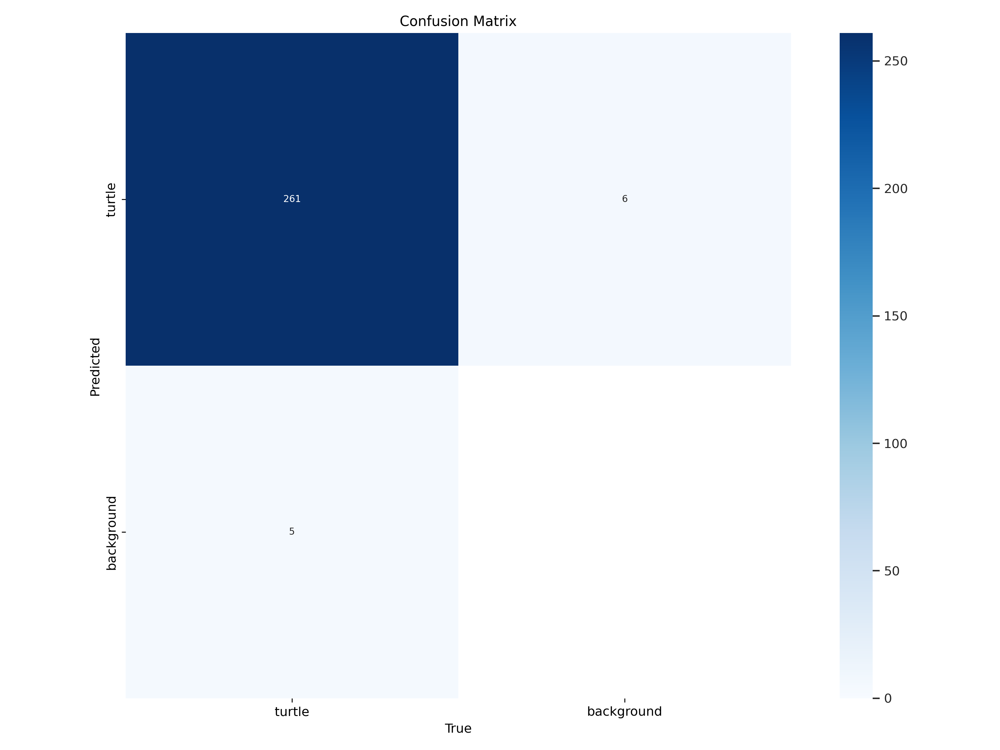

In [ ]:
# confusion matrix
Image(filename=confusion_matrix_path, width=800)

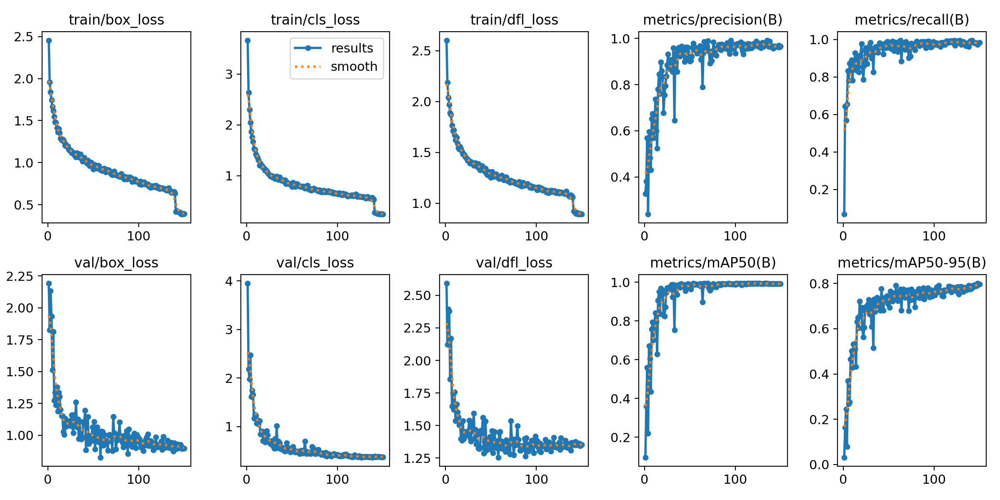

In [ ]:
# training curves
Image(filename=results_png_path, width=800)

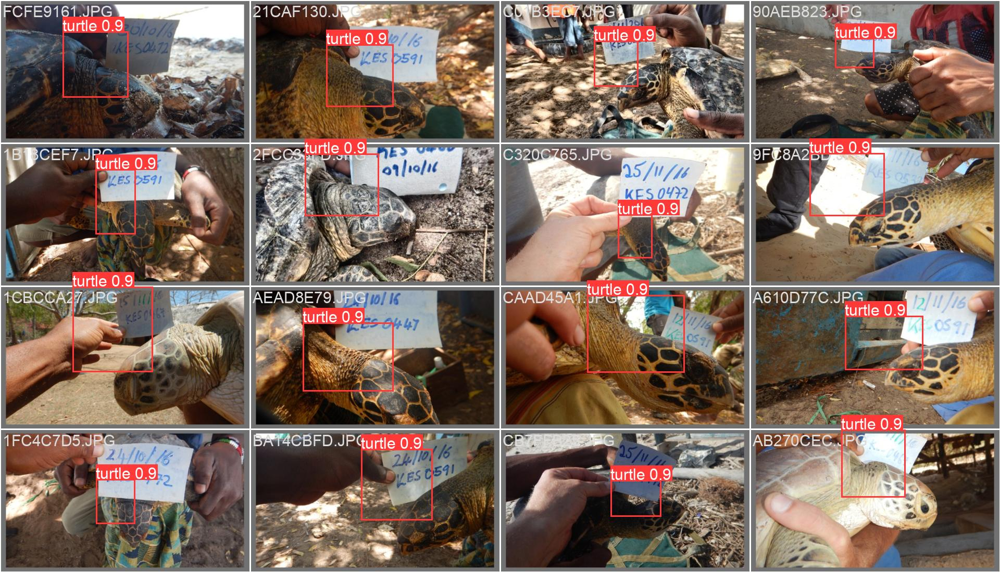

In [ ]:
# val_batch0_pred
Image(filename=val_batch0_pred_path, width=800)

In [ ]:
# location of the YOLO model weights
model_weights = '/content/drive/MyDrive/sea_turtle/detect/train/weights/best.pt'

In [ ]:
# path to your data.yaml file
data_yaml_path = '/content/drive/MyDrive/sea_turtles/data.yaml'

In [ ]:
import os

from ultralytics import YOLO

# Make predictions for the validation set
!yolo task=detect mode=val model={model_weights} data={data_yaml_path}

Ultralytics YOLOv8.2.4 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs
100% 755k/755k [00:00<00:00, 21.5MB/s]
val: Scanning /content/drive/My Drive/sea_turtles/data/labels/val.cache... 266 images, 0 backgrounds, 0 corrupt: 100% 266/266 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 17/17 [01:08<00:00,  4.01s/it]
                   all        266        266      0.969      0.974      0.992      0.799
Speed: 5.5ms preprocess, 206.3ms inference, 0.0ms loss, 12.3ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


In [ ]:
import yaml

# Read the data.yaml file
with open(data_yaml_path, 'r') as f:
    data_yaml = yaml.safe_load(f)


test_image_folder = data_yaml['test']

In [ ]:
# Make predictions for the test images
!yolo task=detect mode=predict model={model_weights} conf=0.5 source='/content/drive/My Drive/sea_turtles/data/images/test'  save_txt=true save_conf=true

Ultralytics YOLOv8.2.4 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs

image 1/695 /content/drive/My Drive/sea_turtles/data/images/test/003B27CF.JPG: 480x640 1 turtle, 256.9ms
image 2/695 /content/drive/My Drive/sea_turtles/data/images/test/008876A9.JPG: 480x640 2 turtles, 154.1ms
image 3/695 /content/drive/My Drive/sea_turtles/data/images/test/00D2330B.JPG: 480x640 1 turtle, 144.4ms
image 4/695 /content/drive/My Drive/sea_turtles/data/images/test/013999E4.JPG: 480x640 1 turtle, 150.2ms
image 5/695 /content/drive/My Drive/sea_turtles/data/images/test/016117B7.JPG: 480x640 1 turtle, 141.5ms
image 6/695 /content/drive/My Drive/sea_turtles/data/images/test/01AFEB73.JPG: 480x640 1 turtle, 155.0ms
image 7/695 /content/drive/My Drive/sea_turtles/data/images/test/01C8BEA0.JPG: 480x640 2 turtles, 262.6ms
image 8/695 /content/drive/My Drive/sea_turtles/data/images/test/0209DE5C.JPG: 384x640 1 turtle, 217

In [ ]:
from IPython.display import HTML, display
from PIL import Image, ImageDraw
import numpy as np
from itertools import cycle

plt.rcParams['animation.embed_limit'] = 256  # Set to 256 MB or any other value as needed

# List files in the directory
image_paths = glob.glob('/content/runs/detect/predict/*.JPG')

# Limit to the first 10 images
image_paths = image_paths[:10]

# Function to generate frames for the animation
def generate_animation_frames():
    for image_path in image_paths:
        with Image.open(image_path) as im:
            draw = ImageDraw.Draw(im)
            # Draw any annotations or bounding boxes here if needed
            yield np.array(im)

# Create the animation function
def animate(i):
    ax.clear()
    frame = next(frames)
    ax.imshow(frame)
    ax.axis('off')

# Create the animation
fig, ax = plt.subplots(figsize=(8, 6))
frames = cycle(generate_animation_frames())
ani = FuncAnimation(fig, animate, frames=range(len(image_paths)), interval=1000, blit=False)

# Clear the output cell to remove any potential extra images
plt.close()

# Display the animation
display(HTML(ani.to_jshtml()))


In [ ]:
# Define the output folder for predictions
output_folder = "/content/runs/detect/predict/labels"

In [ ]:
# Load the submission CSV file
submission_file = "/content/drive/MyDrive/sea_turtles/turtle_submission1.csv"
submission_df = pd.read_csv(submission_file)

In [ ]:
# Update the columns with predictions
predictions = []

for image_id in submission_df['Image_ID']:
    txt_file = os.path.join(output_folder, f"{image_id}.txt")  # Corrected path to labels folder
    print("Checking file:", txt_file)  # Print file path for debugging
    if os.path.exists(txt_file):
        print("File exists.")  # Print confirmation that file exists
        with open(txt_file, 'r') as f:
            data = f.readlines()
            if data:
                # Extract x, y, w, h from the line
                _, x, y, w, h, _ = map(float, data[0].split())  # Ignore class label and confidence level
                predictions.append([x, y, w, h])
            else:
                predictions.append([0, 0, 0, 0])
    else:
        print("File does not exist.")  # Print message indicating file does not exist
        predictions.append([0, 0, 0, 0])

print(predictions)  # Print predictions for debugging

Checking file: /content/runs/detect/predict/labels/4863D911.txt
File exists.
Checking file: /content/runs/detect/predict/labels/6DD3ADD5.txt
File exists.
Checking file: /content/runs/detect/predict/labels/E8DC4D6A.txt
File exists.
Checking file: /content/runs/detect/predict/labels/E02ABB6C.txt
File exists.
Checking file: /content/runs/detect/predict/labels/875C19F4.txt
File exists.
Checking file: /content/runs/detect/predict/labels/5BEAAECC.txt
File exists.
Checking file: /content/runs/detect/predict/labels/51ACD6F6.txt
File exists.
Checking file: /content/runs/detect/predict/labels/A79140B3.txt
File exists.
Checking file: /content/runs/detect/predict/labels/678A0DB3.txt
File exists.
Checking file: /content/runs/detect/predict/labels/9362F0D5.txt
File exists.
Checking file: /content/runs/detect/predict/labels/11DFABDA.txt
File exists.
Checking file: /content/runs/detect/predict/labels/8CD48796.txt
File exists.
Checking file: /content/runs/detect/predict/labels/81CE26B9.txt
File exists.

In [ ]:
# Update the submission DataFrame with predictions
submission_df[['x', 'y', 'w', 'h']] = np.array(predictions)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# Save for submission
submission_df.to_csv(submission_file, index=False)